In [1]:
#If dependencies are not installed uncomment this and run:
#!pip install numpy
#!pip install matplotlib
#!pip install jupyter

#maybe even these two
#!pip install ipykernel
#!pip install notebook

In [2]:
import numpy as np
import numpy.typing as npt

# ===============================
# Simulation settings
# ===============================
start_time = 0.0
stop_time  = 10.0
time_step  = 0.01
omega      = 1.5  # rad/s (driver rate)

# ===============================
# Geometry 
# ===============================
BODY_1 = 4.0   # link1 length (A--B)
BODY_2 = 2.0   # slider offset length (B is below S by BODY_2)
BODY_3 = 16.0  # link3 length (D--E)

# World anchors
O_world = np.array([0.0, 0.0])     # revolute for link1.A
D_world = np.array([-8.0, 0.0])    # revolute for link3.D

# Local points on each body
# link1
s1_A = np.array([-BODY_1/2, 0.0])
s1_B = np.array([+BODY_1/2, 0.0])
# slider (COM is halfway between S and B)
s2_S = np.array([0.0, +BODY_2/2])   # S is +BODY_2/2 above the COM
s2_B = np.array([0.0, -BODY_2/2])   # B is -BODY_2/2 below the COM
# link3 (guide)
s3_D = np.array([-BODY_3/2, 0.0])
s3_E = np.array([+BODY_3/2, 0.0])

# Axis choices for the translation joint (unit +x in each local frame)
u3_loc = np.array([1.0, 0.0])  # guide axis on link3 at E
u2_loc = np.array([1.0, 0.0])  # slider axis at S

# Initial guess (reasonable, not singular)
phi1_0 = np.deg2rad(80.0)   # crank
phi2_0 = np.deg2rad(15.0)   # slider
phi3_0 = np.deg2rad(15.0)   # guide

x1_0, y1_0 = 0.72, 1.86
x2_0, y2_0 = 1.45, 2.00
x3_0, y3_0 = -0.175, 1.663

# Pack/unpack helpers (3 bodies → 9 dof)
def pack_q(x1,y1,p1, x2,y2,p2, x3,y3,p3):
    return np.array([x1,y1,p1, x2,y2,p2, x3,y3,p3], dtype=float).reshape(-1,)

def split_q(q):
    q = np.asarray(q).reshape(-1,)
    return (q[0:3], q[3:6], q[6:9])  # (x,y,phi) per body

# Rotation blocks
def A(phi: float) -> np.ndarray:
    c, s = np.cos(phi), np.sin(phi)
    return np.array([[c,-s],[s, c]], dtype=float)

def B(phi: float) -> np.ndarray:
    c, s = np.cos(phi), np.sin(phi)
    return np.array([[-s,-c],[c,-s]], dtype=float)

R90 = np.array([[0.0,-1.0],[1.0,0.0]])

# World embedding for a local point on body i
def world_point(r_i: npt.ArrayLike, phi_i: float, s_local: npt.ArrayLike) -> np.ndarray:
    r_i = np.asarray(r_i).reshape(2,)
    s_local = np.asarray(s_local).reshape(2,)
    return r_i + A(phi_i) @ s_local

# ===============================
# Constraint functions (Φ rows)
# ===============================

# Revolute to world (absolute joint): (r_i + A_i s_iP) - p_world = 0  → 2 rows
def phi_revolute_abs(r_i: npt.ArrayLike, phi_i: float, s_iP: npt.ArrayLike, p_world: npt.ArrayLike) -> np.ndarray:
    return (world_point(r_i, phi_i, s_iP) - np.asarray(p_world).reshape(2,)).reshape(2,1)

# Revolute between two bodies (relative joint): (r_i + A_i s_iP) - (r_j + A_j s_jQ) = 0  → 2 rows
def phi_revolute_rel(r_i: npt.ArrayLike, phi_i: float, s_iP: npt.ArrayLike,
                     r_j: npt.ArrayLike, phi_j: float, s_jQ: npt.ArrayLike) -> np.ndarray:
    return (world_point(r_i, phi_i, s_iP) - world_point(r_j, phi_j, s_jQ)).reshape(2,1)

# Translation incidence: normal to guide axis dotted with (pS - pE) = 0  → 1 row
def phi_translation_incidence(r_slider: npt.ArrayLike, phi_slider: float, s_slider_S: npt.ArrayLike,
                              r_guide: npt.ArrayLike, phi_guide: float, s_guide_E: npt.ArrayLike,
                              u_guide_local: npt.ArrayLike) -> np.ndarray:
    e3_w = A(phi_guide) @ np.asarray(u_guide_local).reshape(2,)
    n3_w = R90 @ e3_w
    pS   = world_point(r_slider, phi_slider, s_slider_S)
    pE   = world_point(r_guide, phi_guide, s_guide_E)
    inc  = n3_w @ (pS - pE)
    return np.array([[inc]], dtype=float)

# Translation parallelism: normal to guide axis dotted with slider axis = 0  → 1 row
def phi_translation_parallelism(phi_slider: float, phi_guide: float,
                                u_slider_local: npt.ArrayLike, u_guide_local: npt.ArrayLike) -> np.ndarray:
    e3_w = A(phi_guide) @ np.asarray(u_guide_local).reshape(2,)
    n3_w = R90 @ e3_w
    par  = n3_w @ (A(phi_slider) @ np.asarray(u_slider_local).reshape(2,))
    return np.array([[par]], dtype=float)

# Driver on angle: (phi1 - (phi1_0 + omega t)) = 0  → 1 row
def phi_driver_angle(phi1: float, t: float, phi1_ref: float, omega: float) -> np.ndarray:
    return np.array([[phi1 - (phi1_ref + omega * t)]], dtype=float)

# ===============================
# Φ(q, t) — constraint stack (8 joint rows + 1 driver)
# ===============================
def phi_equations_system(q: np.ndarray, t: float) -> np.ndarray:
    (x1,y1,p1), (x2,y2,p2), (x3,y3,p3) = split_q(q)
    r1 = np.array([x1,y1]); r2 = np.array([x2,y2]); r3 = np.array([x3,y3])

    # Revolute A: link1.A ↔ O
    Phi1 = phi_revolute_abs(r1, p1, s1_A, O_world)

    # Revolute B: link1.B ↔ slider.B
    Phi2 = phi_revolute_rel(r1, p1, s1_B, r2, p2, s2_B)

    # Translation (slider S along guide axis at E)
    Phi3_inc = phi_translation_incidence(r2, p2, s2_S, r3, p3, s3_E, u3_loc)
    Phi3_par = phi_translation_parallelism(p2, p3, u2_loc, u3_loc)
    Phi3 = np.vstack([Phi3_inc, Phi3_par])  # 2×1

    # Revolute D: link3.D ↔ world D
    Phi4 = phi_revolute_abs(r3, p3, s3_D, D_world)

    # Driver on link1’s angle
    Phi5 = phi_driver_angle(p1, t, phi1_0, omega)

    return np.vstack([Phi1, Phi2, Phi3, Phi4, Phi5])  # (9,1)

# ===============================
# J(q) — analytic Jacobian (unchanged)
# ===============================
def phi_jacobian(q: np.ndarray) -> np.ndarray:
    (x1,y1,p1), (x2,y2,p2), (x3,y3,p3) = split_q(q)
    r1 = np.array([x1,y1]); r2 = np.array([x2,y2]); r3 = np.array([x3,y3])

    I = np.eye(2)

    # Convenience world terms
    Bs1A = B(p1) @ s1_A
    Bs1B = B(p1) @ s1_B
    Bs2B = B(p2) @ s2_B
    Bs3D = B(p3) @ s3_D

    e3 = A(p3) @ u3_loc
    n3 = R90 @ e3

    J = np.zeros((9,9), dtype=float)

    # rows 0-1: revolute A (link1.A ↔ O) -> d/d(r1)=I, d/d(phi1)=B s1_A
    J[0:2, 0:2] = I
    J[0:2, 2]   = Bs1A

    # rows 2-3: revolute B (link1.B ↔ slider.B)
    J[2:4, 0:2] = I
    J[2:4, 2]   = Bs1B
    J[2:4, 3:5] = -I
    J[2:4, 5]   = -Bs2B

    # rows 4-5: translation (incidence + parallelism)
    # --- incidence row (row 4)
    J[4, 3:5] = n3
    J[4, 6:8] = -n3
    dndphi3 = R90 @ (B(p3) @ u3_loc)
    pS = world_point(r2, p2, s2_S)
    pE = world_point(r3, p3, s3_E)
    alpha3 = dndphi3 @ (pS - pE) + n3 @ ( -B(p3) @ s3_E )
    J[4, 8] = alpha3

    J[4, 5] = n3 @ (B(p2) @ s2_S)

    # --- parallelism row (row 5): n3^T (A(p2) u2) = 0
    J[5, 5] = n3 @ (B(p2) @ u2_loc)
    J[5, 8] = dndphi3 @ (A(p2) @ u2_loc)

    # rows 6-7: revolute D (link3.D ↔ D_world)
    J[6:8, 6:8] = I
    J[6:8, 8]   = Bs3D

    # row 8: driver φ1
    J[8, 2] = 1.0

    return J

# ===============================
# ν(q,t) — explicit time term (only driver)
# ===============================
def nu_vector(q: np.ndarray, t: float) -> np.ndarray:
    nu = np.zeros((9,), dtype=float)
    nu[-1] = omega
    return nu

# ===============================
# Γ(q, qdot) — analytic gamma (-J̇ q̇), including translation
# ===============================
def gamma_revolute_abs(phi: float, phidot: float, s_local: np.ndarray) -> np.ndarray:
    """
    Γ for an absolute revolute joint: (r + A s) = const  →  Γ = A(φ) s · φ̇²  (2 rows)
    """
    return (A(phi) @ s_local) * (phidot**2)


def gamma_revolute_rel(phi_i: float, phidot_i: float, s_i: np.ndarray,
                       phi_j: float, phidot_j: float, s_j: np.ndarray) -> np.ndarray:
    """
    Γ for a relative revolute joint between bodies i and j:
      (r_i + A_i s_i) - (r_j + A_j s_j) = 0
      → Γ =  A(φ_i) s_i · φ̇_i²  -  A(φ_j) s_j · φ̇_j²   (2 rows)
    """
    return (A(phi_i) @ s_i) * (phidot_i**2) - (A(phi_j) @ s_j) * (phidot_j**2)


def gamma_translation_incidence(r_slider: np.ndarray, rdot_slider: np.ndarray, phi_slider: float, phidot_slider: float,
                                r_guide: np.ndarray,  rdot_guide: np.ndarray,  phi_guide: float,  phidot_guide: float,
                                s_slider_S: np.ndarray, s_guide_E: np.ndarray,
                                u_guide_local: np.ndarray) -> float:
    """
    Incidence row for a translation joint:  n³ᵀ (p_S - p_E) = 0
    γ = -(J̇ q̇) for this row, assembled explicitly.

    Notation:
      e3 = A(φ3) u3, n3 = R90 e3,  ṅ3 = R90 ė3 with ė3 = B(φ3) u3 · φ̇3
      pS = r2 + A(φ2) s2_S, pE = r3 + A(φ3) s3_E
    """
    # world axes and their time-derivatives
    e3   = A(phi_guide) @ u_guide_local
    ed3  = B(phi_guide) @ u_guide_local * phidot_guide
    n3   = R90 @ e3
    nd3  = R90 @ ed3

    # points and velocities
    pS   = world_point(r_slider, phi_slider, s_slider_S)
    pE   = world_point(r_guide,  phi_guide,  s_guide_E)
    vS   = rdot_slider + (B(phi_slider) @ s_slider_S) * phidot_slider
    vE   = rdot_guide  + (B(phi_guide)  @ s_guide_E)  * phidot_guide

    # d/dt of the φ3-column coefficient α3 = (∂n3/∂φ3)ᵀ (pS - pE) + n3ᵀ (-B3 s3_E)
    dndphi3   = R90 @ (B(phi_guide) @ u_guide_local)      # ∂n3/∂φ3
    alpha3_dt = (dndphi3 @ (vS - vE)) \
              + ((R90 @ (-A(phi_guide) @ u_guide_local)) @ (pS - pE)) * phidot_guide \
              + (nd3 @ (-B(phi_guide) @ s_guide_E)) \
              + (n3  @ ( A(phi_guide) @ s_guide_E)) * phidot_guide

    # J̇ q̇ contributions: r2/r3 blocks via ṅ3, plus φ3 column via α̇3 φ̇3
    term_r        = nd3 @ (rdot_slider - rdot_guide)
    Jdot_qdot_inc = term_r + alpha3_dt * phidot_guide

    return -Jdot_qdot_inc  # Γ = -J̇ q̇


def gamma_translation_parallelism(phi_slider: float, phidot_slider: float,
                                  phi_guide: float,  phidot_guide: float,
                                  u_slider_local: np.ndarray, u_guide_local: np.ndarray) -> float:
    """
    Parallelism row:  n³ᵀ (A(φ2) u2) = 0
    γ = -(J̇ q̇) = -(γ̇3 φ̇3 + δ̇2 φ̇2) with
      γ3 = (∂n3/∂φ3)ᵀ (A2 u2),   δ2 = n3ᵀ (B2 u2)
    """
    e3   = A(phi_guide) @ u_guide_local
    n3   = R90 @ e3
    nd3  = R90 @ (B(phi_guide) @ u_guide_local) * phidot_guide   # ṅ3

    dndphi3   = R90 @ (B(phi_guide) @ u_guide_local)
    A2u2      = A(phi_slider) @ u_slider_local
    B2u2      = B(phi_slider) @ u_slider_local

    # time derivatives of column coefficients
    gamma3_dt = (dndphi3 @ B2u2) * phidot_slider + ((R90 @ (-A(phi_guide) @ u_guide_local)) @ A2u2) * phidot_guide
    delta2_dt = (nd3 @ B2u2) + (n3 @ (-A(phi_slider) @ u_slider_local)) * phidot_slider

    Jdot_qdot_par = gamma3_dt * phidot_guide + delta2_dt * phidot_slider
    return -Jdot_qdot_par  # Γ = -J̇ q̇


def gamma_vector(q: np.ndarray, qdot: np.ndarray) -> np.ndarray:
    """
    Full Γ(q, q̇) stacked in the same row order as Φ and J:
      [ revA(2), revB(2), trans-inc(1), trans-par(1), revD(2), driver(1) ]  →  (9,)
    Recall: Γ = -J̇ q̇   (no explicit time terms here; driver row is 0).
    """
    # unpack
    (x1,y1,p1), (x2,y2,p2), (x3,y3,p3) = split_q(q)
    (xd1,yd1,pd1), (xd2,yd2,pd2), (xd3,yd3,pd3) = split_q(qdot)

    r1 = np.array([x1,y1]); r2 = np.array([x2,y2]); r3 = np.array([x3,y3])
    rd1 = np.array([xd1,yd1]); rd2 = np.array([xd2,yd2]); rd3 = np.array([xd3,yd3])

    g = np.zeros((9,), dtype=float)

    # rows 0-1: revolute A (link1.A ↔ O)
    g[0:2] = gamma_revolute_abs(p1, pd1, s1_A)

    # rows 2-3: revolute B (link1.B ↔ slider.B)
    g[2:4] = gamma_revolute_rel(p1, pd1, s1_B, p2, pd2, s2_B)

    # row 4: translation incidence
    g[4] = gamma_translation_incidence(
        r_slider=r2, rdot_slider=rd2, phi_slider=p2, phidot_slider=pd2,
        r_guide=r3,  rdot_guide=rd3,  phi_guide=p3,  phidot_guide=pd3,
        s_slider_S=s2_S, s_guide_E=s3_E,
        u_guide_local=u3_loc
    )

    # row 5: translation parallelism
    g[5] = gamma_translation_parallelism(
        phi_slider=p2, phidot_slider=pd2,
        phi_guide=p3,  phidot_guide=pd3,
        u_slider_local=u2_loc, u_guide_local=u3_loc
    )

    # rows 6-7: revolute D (link3.D ↔ world D)
    g[6:8] = gamma_revolute_abs(p3, pd3, s3_D)

    # row 8: driver (φ1 - φd(t)) → Γ = 0
    g[8] = 0.0

    return g


# ===============================
# Newton + stepping (positions, then velocities & accelerations)
# ===============================
def newton_rhapson(function, initial_guess, jacobian, t=0.0, rtol=1e-10, max_iter=60, verbose=False):
    q = initial_guess.reshape(-1,1)
    for k in range(max_iter):
        F = function(q.reshape(-1,), t)
        if F.ndim == 2: F = F.reshape(-1,1)
        if np.linalg.norm(F, ord=np.inf) < rtol:
            break
        J = jacobian(q.reshape(-1,))
        dq = np.linalg.solve(J, -F).reshape(-1,1)
        q = q + dq
    return q

def get_velocity_matrix(position_matrix, jacobian, nu_fun):
    T = position_matrix.shape[1]
    v = np.empty_like(position_matrix)
    for i in range(T):
        q = position_matrix[:, i]
        J = jacobian(q)
        nu = nu_fun(q, 0.0)  # only driver depends on t explicitly; magnitude is constant
        v[:, i] = np.linalg.solve(J, nu)
    return v

def get_acceleration_matrix(position_matrix, velocity_matrix, jacobian, gamma_fun):
    T = position_matrix.shape[1]
    a = np.empty_like(position_matrix)
    for i in range(T):
        q = position_matrix[:, i]
        qd = velocity_matrix[:, i]
        J = jacobian(q)
        g = gamma_fun(q, qd)
        a[:, i] = np.linalg.solve(J, g)
    return a

def solve_systems(function, initial_guess, jacobian, t_start, t_stop, t_step, rtol=1e-10, max_iter=60, verbose=False):
    q_curr = initial_guess.reshape(-1,1)
    times = np.arange(t_start, t_stop + 1e-12, t_step)
    Q = np.empty((q_curr.size, times.size))
    for i, t in enumerate(times):
        q_curr = newton_rhapson(function, q_curr, jacobian, t=t, rtol=rtol, max_iter=max_iter, verbose=verbose)
        Q[:, i] = q_curr.reshape(-1)

    V = get_velocity_matrix(Q, jacobian, nu_vector)
    A = get_acceleration_matrix(Q, V, jacobian, gamma_vector)
    return Q, V, A, times

# ===============================
# Run
# ===============================
IG = pack_q(x1_0,y1_0,phi1_0,  x2_0,y2_0,phi2_0,  x3_0,y3_0,phi3_0)
pos, vel, acc, tvec = solve_systems(phi_equations_system, IG, phi_jacobian, start_time, stop_time, time_step)

with np.printoptions(precision=4, suppress=True, linewidth=160):
    print("q(t0)     =", pos[:,0])
    print("qdot(t0)  =", vel[:,0])
    print("qddot(t0) =", acc[:,0])
    print("q(t_end)  =", pos[:,-1])
    print("qdot(end) =", vel[:,-1])
    print("qddot(end)=", acc[:,-1])


q(t0)     = [ 0.3473  1.9696  1.3963  0.1002  4.7434  0.6365 -1.5665  4.755   0.6365]
qdot(t0)  = [-2.9544  0.5209  1.5    -6.2836  0.7649  0.4661 -2.2161  2.9984  0.4661]
qddot(t0) = [-0.7814 -4.4316 -0.     -1.269  -8.9162 -0.2049 -0.4232 -2.351  -0.2049]
q(t_end)  = [-1.5447 -1.2705 16.3963 -2.9821 -1.5467 -0.1074 -0.0461 -0.8573 -0.1074]
qdot(end) = [ 1.9057 -2.317   1.5     4.6212 -4.7213 -0.8146 -0.6984 -6.4789 -0.8146]
qddot(end)= [ 3.4755  2.8585  0.      4.0371  5.3638  2.8592 -2.8262 23.3109  2.8592]


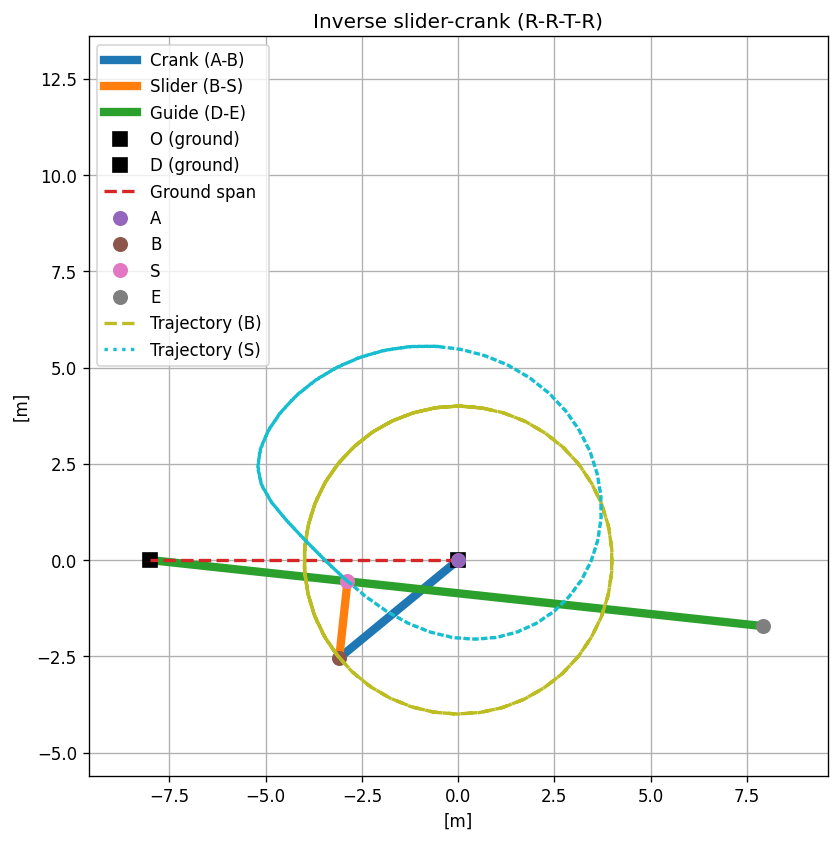

In [3]:
# ---------------------- PLOTTING THE MECHANISM (adapted) ----------------------
# pos has shape (9, T):
# [x1, y1, phi1, x2, y2, phi2, x3, y3, phi3] by rows, time by columns
# tvec has length T, time_step is your dt

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

T = pos.shape[1]
dt = time_step

frame_step = 10  # 1=every frame, 10=every 10th, 100=every 100th, ...
frames_idx = np.arange(0, T, frame_step)

fps = int(round(1.0 / (dt * frame_step)))
interval_ms = int(round(1000 * dt * frame_step))

# Convenience slices
r1 = pos[0:2, :].T  # (T, 2)
p1 = pos[2, :]      # (T,)
r2 = pos[3:5, :].T
p2 = pos[5, :]
r3 = pos[6:8, :].T
p3 = pos[8, :]

# Vectorized transform of a local point s=[sx, sy] on a body (r, phi) -> world
def transform_series(r_xy, phi, s_xy):
    sx, sy = float(s_xy[0]), float(s_xy[1])
    c, s = np.cos(phi), np.sin(phi)
    x = r_xy[:, 0] + c * sx - s * sy
    y = r_xy[:, 1] + s * sx + c * sy
    return np.column_stack([x, y])  # (T, 2)

# Joint/feature global positions over time (matching the new mechanism):
PA = transform_series(r1, p1, s1_A)  # link1: A (revolute to O_world)
PB = transform_series(r1, p1, s1_B)  # link1: B == slider B
PS = transform_series(r2, p2, s2_S)  # slider: S (slides along guide axis)
PD = transform_series(r3, p3, s3_D)  # guide: D (revolute to D_world)
PE = transform_series(r3, p3, s3_E)  # guide: E (point defining guide axis)

# Axis limits (pad around all tracked paths)
all_x = np.hstack([PA[:,0], PB[:,0], PS[:,0], PD[:,0], PE[:,0], [O_world[0], D_world[0]]])
all_y = np.hstack([PA[:,1], PB[:,1], PS[:,1], PD[:,1], PE[:,1], [O_world[1], D_world[1]]])
xmin, xmax = all_x.min(), all_x.max()
ymin, ymax = all_y.min(), all_y.max()
padx = 0.1 * max(1e-9, xmax - xmin)
pady = 0.1 * max(1e-9, ymax - ymin)

fig, ax = plt.subplots(figsize=(10, 8), dpi=120)
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(xmin - padx, xmax + padx)
ax.set_ylim(ymin - pady, ymax + pady)
ax.grid(True)
ax.set_xlabel('[m]')
ax.set_ylabel('[m]')
ax.set_title('Inverse slider-crank (R-R-T-R)')

# Link segments (current configuration)
# crank A-B, slider B-S, guide D-E
(crank_line,)  = ax.plot([], [], '-',  linewidth=5, animated=True, label='Crank (A-B)')
(slider_line,) = ax.plot([], [], '-',  linewidth=5, animated=True, label='Slider (B-S)')
(guide_line,)  = ax.plot([], [], '-',  linewidth=5, animated=True, label='Guide (D-E)')

# Ground anchors O and D (fixed)
(O_marker,) = ax.plot([O_world[0]], [O_world[1]], 'ks', markersize=8, label='O (ground)')
(D_marker,) = ax.plot([D_world[0]], [D_world[1]], 'ks', markersize=8, label='D (ground)')
(ground_line,) = ax.plot([O_world[0], D_world[0]], [O_world[1], D_world[1]], '--', linewidth=2, label='Ground span')

# Joint markers
(A_marker,) = ax.plot([], [], 'o', markersize=8, animated=True, label='A')
(B_marker,) = ax.plot([], [], 'o', markersize=8, animated=True, label='B')
(S_marker,) = ax.plot([], [], 'o', markersize=8, animated=True, label='S')
(E_marker,) = ax.plot([], [], 'o', markersize=8, animated=True, label='E')

# Trajectory traces (for B and S)
(traj_B_line,) = ax.plot([], [], '--', linewidth=2, animated=True, label='Trajectory (B)')
(traj_S_line,) = ax.plot([], [], ':',  linewidth=2, animated=True, label='Trajectory (S)')

ax.legend(loc='upper left')

def frame_update(i):
    idx = frames_idx[i]
    a = PA[idx]; b = PB[idx]; s = PS[idx]; d = PD[idx]; e = PE[idx]

    crank_line.set_data([a[0], b[0]], [a[1], b[1]])
    slider_line.set_data([b[0], s[0]], [b[1], s[1]])
    guide_line.set_data([d[0], e[0]], [d[1], e[1]])
    # ground_line is fixed; no per-frame update needed

    A_marker.set_data([a[0]], [a[1]])
    B_marker.set_data([b[0]], [b[1]])
    S_marker.set_data([s[0]], [s[1]])
    E_marker.set_data([e[0]], [e[1]])

    # trace only the shown (subsampled) frames
    traj_B_line.set_data(PB[frames_idx[:i+1], 0], PB[frames_idx[:i+1], 1])
    traj_S_line.set_data(PS[frames_idx[:i+1], 0], PS[frames_idx[:i+1], 1])

    return (crank_line, slider_line, guide_line,
            A_marker, B_marker, S_marker, E_marker,
            traj_B_line, traj_S_line)

# Recreate the animation (interval is in ms)
anim = FuncAnimation(
    fig,
    frame_update,
    frames=len(frames_idx),
    blit=True,
    interval=interval_ms,
)

# Save a GIF and also embed inline if you're in a notebook
anim.save("saved_animation.gif", fps=fps)
HTML(anim.to_jshtml(fps=fps))


In [4]:

# --- Save the first frame as a PNG ---
first_i = 0   # if you're using subsampling
frame_update(first_i)           # draw final state onto the artists
fig.canvas.draw()              # ensure the canvas is updated
fig.savefig("mechanism_first_frame.png", dpi=300, bbox_inches="tight")
# --- Save the last frame as a PNG ---
last_i = len(frames_idx) - 1   # if you're using subsampling
frame_update(last_i)           # draw final state onto the artists
fig.canvas.draw()              # ensure the canvas is updated
fig.savefig("mechanism_last_frame.png", dpi=300, bbox_inches="tight")



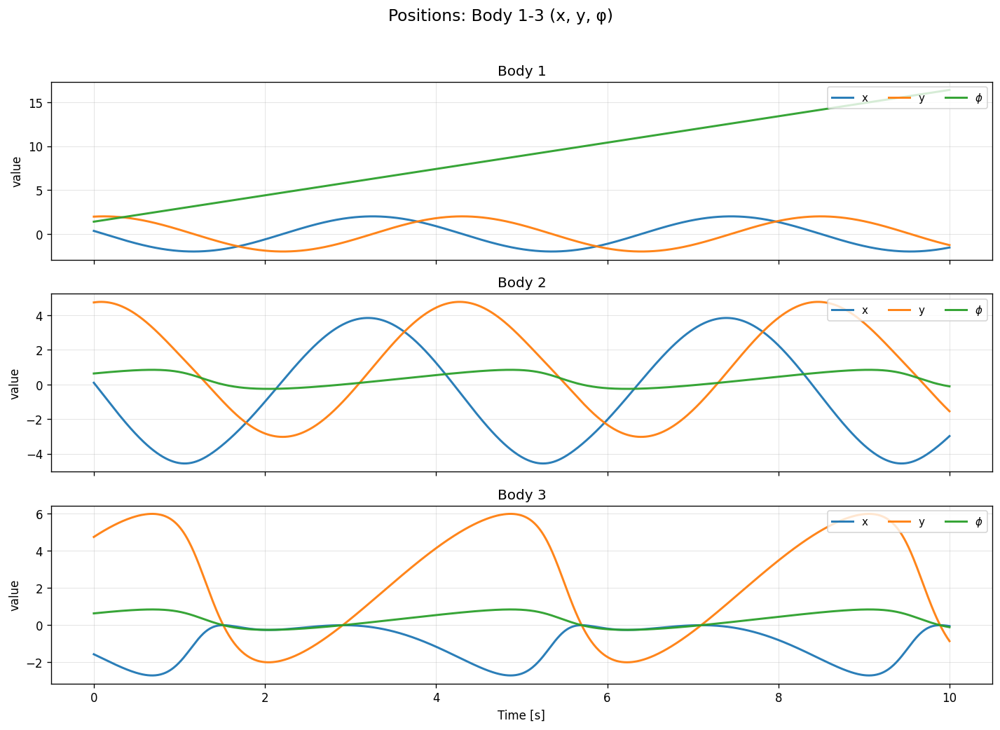

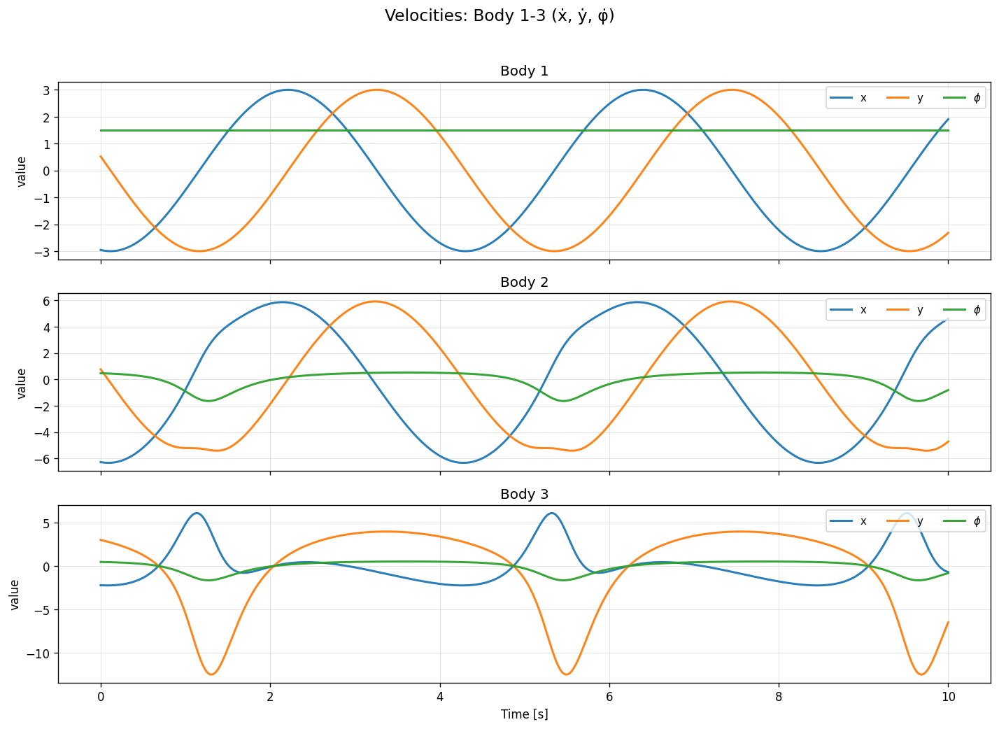

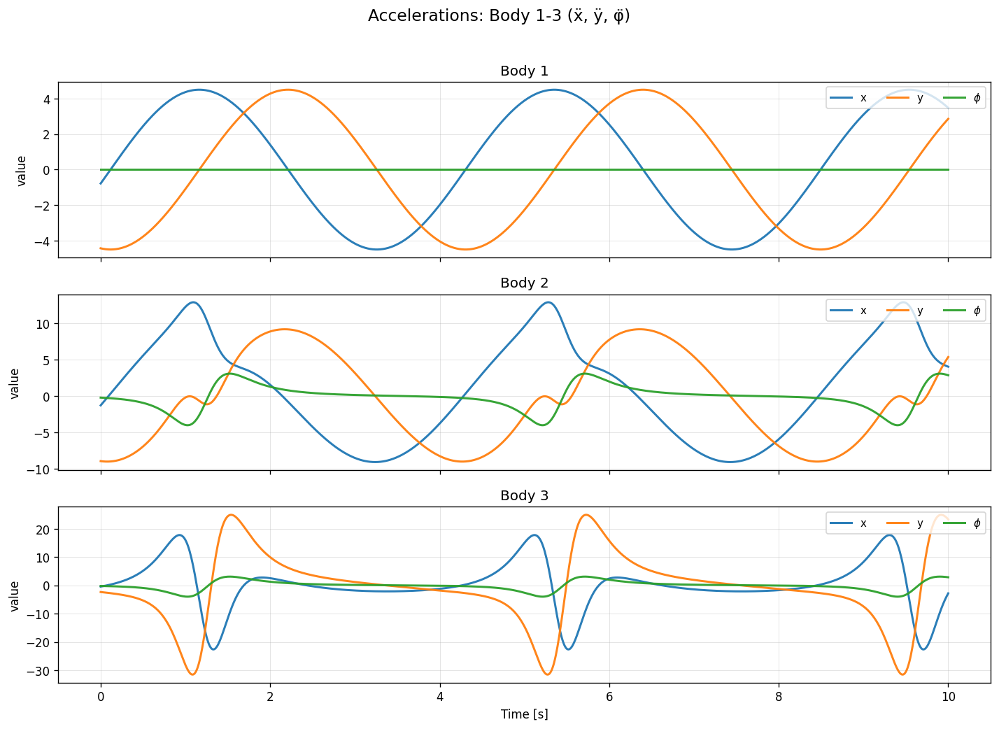

In [5]:
# --- BODY STATES: positions, velocities, accelerations for bodies 1..3 ---
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------
# Resolve data sources (new names first, then fallbacks)
# ---------------------------
try:
    Q, V, ACC, t = pos, vel, acc, tvec
except NameError:
    # fallbacks from earlier cells
    Q  = globals().get("position_matrix",  globals().get("test_example"))
    V  = globals().get("velocity_matrix",  globals().get("test_velocity"))
    A_ = globals().get("acceleration_matrix", globals().get("test_acceleration"))
    t  = globals().get("time_vector", globals().get("test_time_vector"))
    ACC = A_

if Q is None or V is None or ACC is None or t is None:
    raise RuntimeError("Missing data: ensure pos/vel/acc/tvec (or test_* equivalents) exist.")

# Sanity: ensure time aligns with columns
if Q.shape[1] != len(t):
    raise ValueError(f"Time vector length ({len(t)}) != data columns ({Q.shape[1]}).")

# ---------------------------
# Helpers
# ---------------------------
def body_state_indices(body_number: int):
    """
    Return the indices [x_i, y_i, phi_i] for body 1..3 in the stacked state:
    [x1,y1,φ1, x2,y2,φ2, x3,y3,φ3]
    """
    base = 3*(body_number-1)
    return [base + 0, base + 1, base + 2]

def plot_states_matrix(M: np.ndarray, t: np.ndarray, title: str, unwrap_angles: bool):
    """
    Plot a 3x1 figure (one row per body). In each row, plot x, y, φ of that body.
    M is a (9 x T) matrix holding either positions (Q), velocities (V), or accelerations (A).
    """
    # Optionally unwrap only the φ rows (2,5,8) for nicer position plots
    if unwrap_angles:
        M_plot = M.copy()
        for k in [2, 5, 8]:
            M_plot[k, :] = np.unwrap(M_plot[k, :])
    else:
        M_plot = M

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 9), dpi=120, sharex=True)
    fig.suptitle(title, fontsize=14)

    labels_comp = ["x", "y", r"$\phi$"]
    lw = 1.8
    alpha = 0.95

    for b in (1, 2, 3):
        ax = axes[b-1]
        idx_x, idx_y, idx_phi = body_state_indices(b)
        ax.plot(t, M_plot[idx_x, :], linewidth=lw, alpha=alpha, label=labels_comp[0])
        ax.plot(t, M_plot[idx_y, :], linewidth=lw, alpha=alpha, label=labels_comp[1])
        ax.plot(t, M_plot[idx_phi, :], linewidth=lw, alpha=alpha, label=labels_comp[2])
        ax.set_title(f"Body {b}", fontsize=12)
        ax.grid(True, which='both', linewidth=0.5, alpha=0.4)
        ax.legend(loc='upper right', ncol=3, fontsize=9)
        ax.set_ylabel("value")

    axes[-1].set_xlabel("Time [s]")
    fig.tight_layout(rect=[0, 0.02, 1, 0.96])
    plt.show()
    return fig

# ---------------------------
# Make the three figures
# ---------------------------
fig_pos = plot_states_matrix(Q, t, "Positions: Body 1-3 (x, y, φ)", unwrap_angles=True)
fig_vel = plot_states_matrix(V, t, "Velocities: Body 1-3 (ẋ, ẏ, φ̇)", unwrap_angles=False)
fig_acc = plot_states_matrix(ACC, t, "Accelerations: Body 1-3 (ẍ, ÿ, φ̈)", unwrap_angles=False)

# Optional: save high-res PNGs
fig_pos.savefig("states_positions.png", dpi=300, bbox_inches="tight")
fig_vel.savefig("states_velocities.png", dpi=300, bbox_inches="tight")
fig_acc.savefig("states_accelerations.png", dpi=300, bbox_inches="tight")


Max |a_E| = 66.2384 at t = 9.42 s  (aEx=25.5623, aEy=-61.1072)


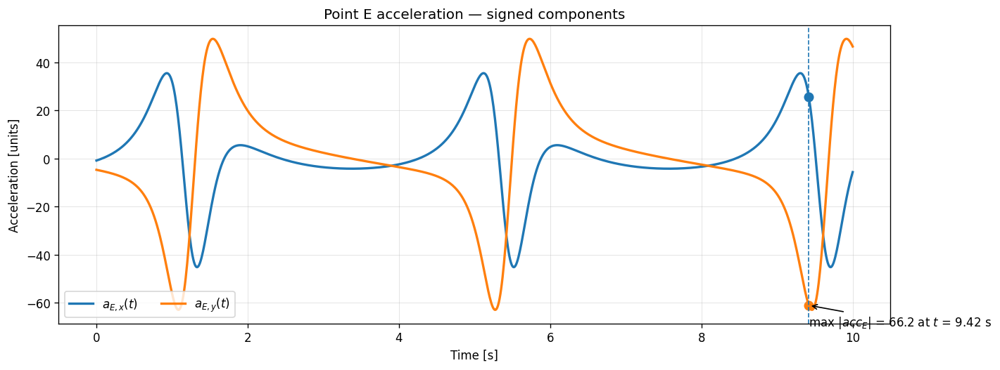

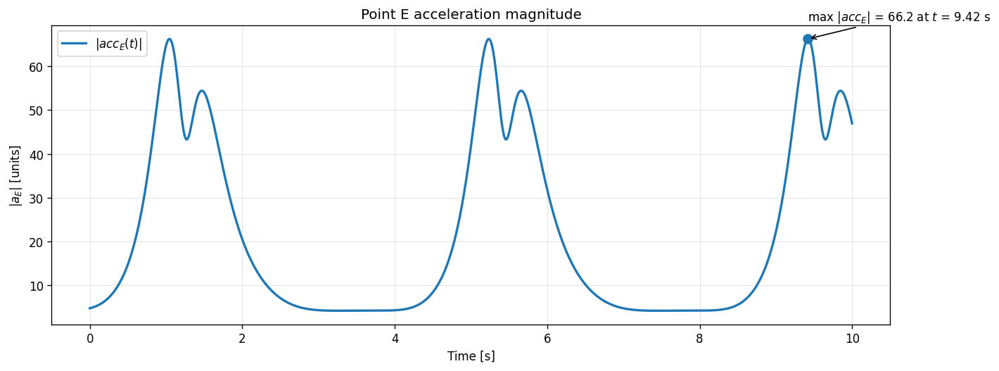

In [6]:
# ==== CELL: Point E acceleration — components (signed) + magnitude with arrowed markers ====

import numpy as np
import matplotlib.pyplot as plt

# ---------------------------
# Resolve data sources (new names first, then fallbacks)
# ---------------------------
try:
    Q, V, ACC, t = pos, vel, acc, tvec
except NameError:
    Q  = globals().get("position_matrix",  globals().get("test_example"))
    V  = globals().get("velocity_matrix",  globals().get("test_velocity"))
    A_ = globals().get("acceleration_matrix", globals().get("test_acceleration"))
    t  = globals().get("time_vector", globals().get("test_time_vector"))
    ACC = A_

if Q is None or V is None or ACC is None or t is None:
    raise RuntimeError("Missing data arrays (pos/vel/acc/tvec or their fallbacks).")

# ---------------------------
# Rotation helpers (reuse names from your setup)
# ---------------------------
def A_rot(phi: float) -> np.ndarray:
    c, s = np.cos(phi), np.sin(phi)
    return np.array([[c, -s], [s,  c]], dtype=float)

def B_rot(phi: float) -> np.ndarray:
    c, s = np.cos(phi), np.sin(phi)
    return np.array([[-s, -c], [c, -s]], dtype=float)

# ---------------------------
# Inputs for point E on body 3
# ---------------------------
assert 's3_E' in globals(), "s3_E not found — run the mechanism setup cell first."
sE = np.asarray(s3_E).reshape(2,)

# Convenience slices (body 3: indices 6..8)
r3     = Q[6:8, :].T
phi3   = Q[8, :]
rd3    = V[6:8, :].T
phid3  = V[8, :]
rdd3   = ACC[6:8, :].T
phidd3 = ACC[8, :]

# ---------------------------
# Acceleration of point E: a_E = r̈3 + B(φ3) sE * φ̈3 - A(φ3) sE * (φ̇3)^2
# ---------------------------
T = Q.shape[1]
aE = np.zeros((T, 2))
for i in range(T):
    aE[i, :] = (
        rdd3[i, :]
        + (B_rot(phi3[i]) @ sE) * phidd3[i]
        - (A_rot(phi3[i]) @ sE) * (phid3[i] ** 2)
    )

aE_x  = aE[:, 0]
aE_y  = aE[:, 1]
aE_mag = np.linalg.norm(aE, axis=1)

# Peak (largest magnitude)
i_max = int(np.argmax(aE_mag))
t_max = float(t[i_max])
a_max = float(aE_mag[i_max])

print(f"Max |a_E| = {a_max:.6g} at t = {t_max:.6g} s  (aEx={aE_x[i_max]:.6g}, aEy={aE_y[i_max]:.6g})")

# ===========================
# Figure 1: Signed components with arrow on the larger component at t_max
# ===========================
fig1, ax1 = plt.subplots(figsize=(12, 4.5), dpi=120)
ax1.plot(t, aE_x, linewidth=2, label=r"$a_{E,x}(t)$")
ax1.plot(t, aE_y, linewidth=2, label=r"$a_{E,y}(t)$")

# Mark the time of global max |a_E|
ax1.axvline(t_max, linewidth=1, linestyle="--")
ax1.scatter([t_max], [aE_x[i_max]], s=55)
ax1.scatter([t_max], [aE_y[i_max]], s=55)

# Choose the component with larger |value| at t_max to annotate
val_for_arrow = aE_x[i_max] if abs(aE_x[i_max]) >= abs(aE_y[i_max]) else aE_y[i_max]
label_y = val_for_arrow
offset  = 0.06 * (np.max(np.abs([aE_x, aE_y])) + 1e-12)  # small vertical offset
note    = rf"max $|acc_E|$ = {a_max:.3g} at $t$ = {t_max:.3g} s"

ax1.annotate(note,
             xy=(t_max, label_y),
             xytext=(t_max, label_y + (offset if label_y >= 0 else -offset)),
             arrowprops=dict(arrowstyle='->', lw=1),
             ha='left', va='bottom' if label_y >= 0 else 'top',
             fontsize=10)

ax1.set_title("Point E acceleration — signed components")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Acceleration [units]")
ax1.grid(True, which='both', linewidth=0.5, alpha=0.4)
ax1.legend(loc="best", ncol=2)
fig1.tight_layout()
plt.show()

# ===========================
# Figure 2: Magnitude with classic marker + arrow
# ===========================
fig2, ax2 = plt.subplots(figsize=(12, 4.5), dpi=120)
ax2.plot(t, aE_mag, linewidth=2, label=r"$|acc_E(t)|$")
ax2.scatter([t_max], [a_max], s=60)
ax2.annotate(rf"max $|acc_E|$ = {a_max:.3g} at $t$ = {t_max:.3g} s",
             xy=(t_max, a_max),
             xytext=(t_max, a_max * 1.05 if a_max != 0 else 0.05),
             arrowprops=dict(arrowstyle='->', lw=1),
             ha='left', va='bottom', fontsize=10)
ax2.set_title("Point E acceleration magnitude")
ax2.set_xlabel("Time [s]")
ax2.set_ylabel(r"$|a_E|$ [units]")
ax2.grid(True, which='both', linewidth=0.5, alpha=0.4)
ax2.legend(loc="best")
fig2.tight_layout()
plt.show()

# Optional: save figures
fig1.savefig("point_E_accel_components.png", dpi=300, bbox_inches="tight")
fig2.savefig("point_E_accel_magnitude.png",  dpi=300, bbox_inches="tight")


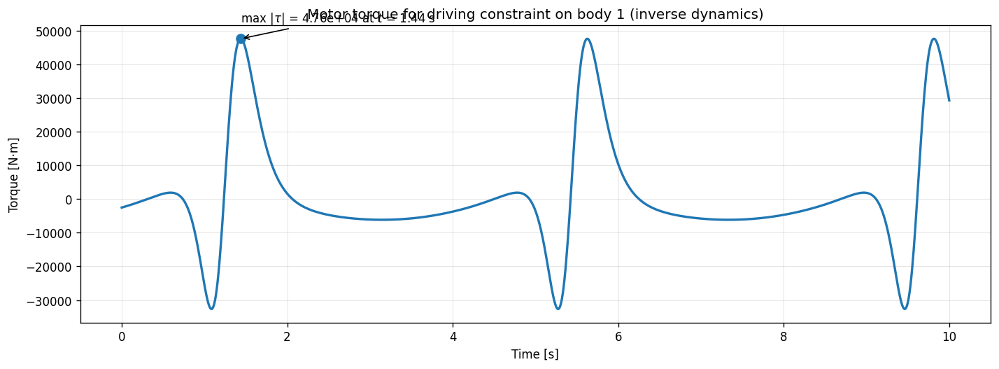

In [7]:
# ==== CELL: Inverse dynamics — motor torque for the driving constraint on body 1 ====

import numpy as np
import matplotlib.pyplot as plt

# --- Rotation blocks used by phi_jacobian redefined due to naming error with function ---
def ACC(phi: float) -> np.ndarray:
    c, s = np.cos(phi), np.sin(phi)
    return np.array([[c, -s], [s,  c]], dtype=float)

def B(phi: float) -> np.ndarray:
    c, s = np.cos(phi), np.sin(phi)
    return np.array([[-s, -c], [c, -s]], dtype=float)

# --- Parameters ---
g  = 9.81
m1 = 40
m2 = 20
m3 = 160
J1 = 53.33
J2 = 13.33
J3 = 3413.0


# --- Kinematics (new names first, then fallbacks) ---
try:
    Q, V, Acc, t = pos, vel, acc, tvec
except NameError:
    Q   = globals().get("position_matrix",  globals().get("test_example"))
    V   = globals().get("velocity_matrix",  globals().get("test_velocity"))
    Acc = globals().get("acceleration_matrix", globals().get("test_acceleration"))
    t   = globals().get("time_vector",      globals().get("test_time_vector"))

if Q is None or V is None or Acc is None or t is None:
    raise RuntimeError("Missing data arrays (pos/vel/acc/tvec or their fallbacks).")

# --- Mass matrix and applied generalized forces (gravity only) ---
# state: [x1,y1,phi1, x2,y2,phi2, x3,y3,phi3]
M = np.diag([m1, m1, J1,  m2, m2, J2,  m3, m3, J3])
Q_app = np.array([0, -m1*g, 0,  0, -m2*g, 0,  0, -m3*g, 0], dtype=float)

# --- Safety: phi_jacobian must be defined already (it uses A,B we just defined) ---
assert callable(globals().get('phi_jacobian', None)), "phi_jacobian(q) not found."

# --- Inverse dynamics: Φ_q^T λ = M q̈ − Q_app; motor torque τ = −λ_driver ---
T = Q.shape[1]
tau_motor = np.zeros(T)
for k in range(T):
    q   = Q[:, k]
    qdd = Acc[:, k]
    J   = phi_jacobian(q)               # 9×9, includes driver row
    rhs = M @ qdd - Q_app               # 9,
    lam = np.linalg.solve(J.T, rhs)     # 9,
    tau_motor[k] = -lam[8]              # driver row is last (index 8)

# --- Plot with marker at largest |τ| ---
i_peak = int(np.argmax(np.abs(tau_motor)))
t_peak = float(t[i_peak]); tau_pk = float(tau_motor[i_peak])

fig, ax = plt.subplots(figsize=(12, 4.5), dpi=120)
ax.plot(t, tau_motor, linewidth=2)
ax.scatter([t_peak], [tau_pk], s=60)
ax.annotate(rf"max $|\tau|$ = {abs(tau_pk):.3g} at $t$ = {t_peak:.3g} s",
            xy=(t_peak, tau_pk),
            xytext=(t_peak, tau_pk + 0.08*(np.max(np.abs(tau_motor))+1e-12)*np.sign(tau_pk)),
            arrowprops=dict(arrowstyle='->', lw=1),
            ha='left', va='bottom' if tau_pk >= 0 else 'top', fontsize=10)

ax.set_title("Motor torque for driving constraint on body 1 (inverse dynamics)")
ax.set_xlabel("Time [s]")
ax.set_ylabel("Torque [N·m]")
ax.grid(True, which='both', linewidth=0.5, alpha=0.4)
fig.tight_layout()
plt.show()

fig.savefig("motor_torque_body1_driver.png", dpi=300, bbox_inches="tight")


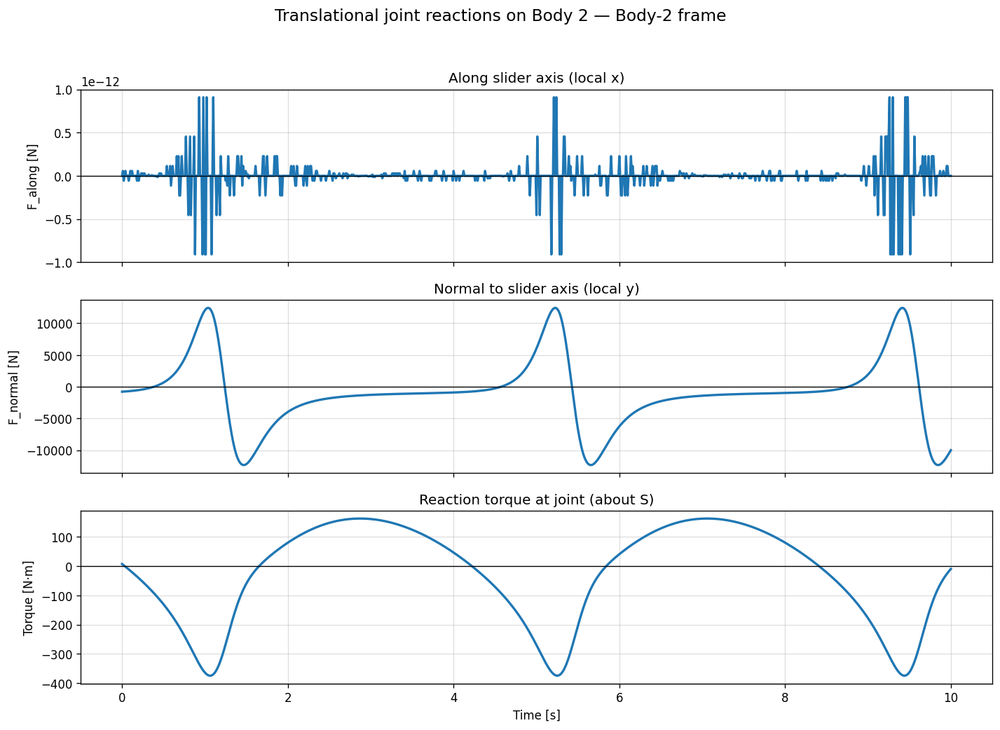

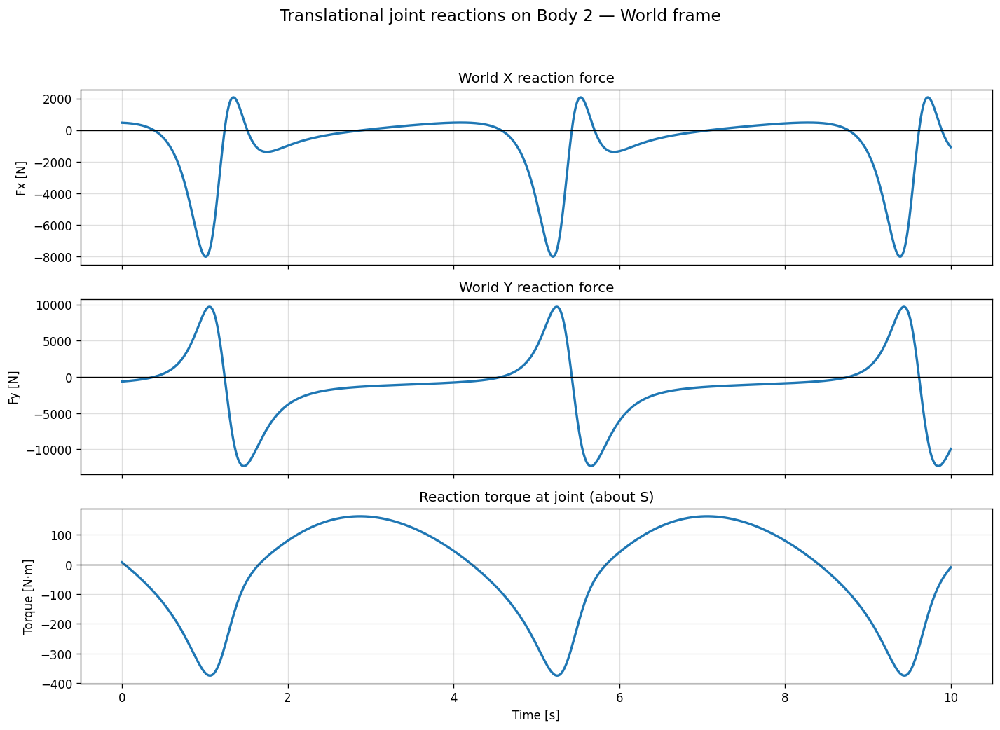

In [8]:
# ==== CELL: Translational joint reactions on body 2 — reuse A(), B(), phi_jacobian() from above ====

import numpy as np
import matplotlib.pyplot as plt

# --- require the helpers from the cell above ---
assert callable(globals().get("A", None)), "A(phi) not found (define it in the cell above)."
assert callable(globals().get("B", None)), "B(phi) not found (define it in the cell above)."
assert callable(globals().get("phi_jacobian", None)), "phi_jacobian(q) not found."
assert 's2_S' in globals(), "s2_S not found — run the mechanism setup cell first."

# --- kinematic data (prefer new names; otherwise use fallbacks) ---
try:
    Q, V, Acc, t = pos, vel, acc, tvec
except NameError:
    Q   = globals().get("position_matrix",  globals().get("test_example"))
    V   = globals().get("velocity_matrix",  globals().get("test_velocity"))
    Acc = globals().get("acceleration_matrix", globals().get("test_acceleration"))
    t   = globals().get("time_vector",      globals().get("test_time_vector"))

if Q is None or V is None or Acc is None or t is None:
    raise RuntimeError("Missing data arrays (pos/vel/acc/tvec or their fallbacks).")

# --- dynamics parameters ---
g  = 9.81
m1 = 40
m2 = 20
m3 = 160
J1 = 53.33
J2 = 13.33
J3 = 3413.0

# generalized mass matrix and applied generalized forces (gravity only)
# state order: [x1,y1,phi1, x2,y2,phi2, x3,y3,phi3]
M = np.diag([m1, m1, J1,  m2, m2, J2,  m3, m3, J3])
Q_app = np.array([0, -m1*g, 0,  0, -m2*g, 0,  0, -m3*g, 0], dtype=float)

# --- storage ---
T = Q.shape[1]
F_world = np.zeros((T, 2))   # reaction force on body 2 at the translational joint (world components)
tau_S   = np.zeros(T)        # reaction torque at the joint about S (scalar)

# indices of the translational joint rows in Φ/J stack: [revA(2), revB(2), trans-inc(1), trans-par(1), revD(2), driver(1)]
row_inc, row_par = 4, 5

sS = np.asarray(s2_S).reshape(2,)

for k in range(T):
    q   = Q[:, k]
    qdd = Acc[:, k]

    J = phi_jacobian(q)             # 9×9 Jacobian (includes driver row)
    rhs = M @ qdd - Q_app           # 9,

    lam = np.linalg.solve(J.T, rhs) # 9,
    lam_t = lam[row_inc:row_par+1]  # (2,) multipliers for translational rows

    # body-2 block of those two rows (columns for x2,y2,phi2 are 3..5)
    J_t_rows  = J[row_inc:row_par+1, :]   # (2×9)
    J_body2   = J_t_rows[:, 3:6]          # (2×3)

    # generalized reaction on body 2’s COM: [Fx, Fy, M_COM]
    Fx, Fy, M_com = (J_body2.T @ lam_t)

    # shift moment from COM to the joint point S (τ_S = M_com − r×F, with r = A(φ2) s2_S)
    phi2 = q[5]
    r_cS = ACC(phi2) @ sS
    tau_S[k] = float(M_com - (r_cS[0]*Fy - r_cS[1]*Fx))

    # store world force components
    F_world[k, :] = [Fx, Fy]

# --- body-2 frame components (along slider axis = local +x, normal = local +y) ---
phi2_vec = Q[5, :]
u2_w = np.column_stack([np.cos(phi2_vec), np.sin(phi2_vec)])     # body-2 x-axis in world
n2_w = np.column_stack([-np.sin(phi2_vec), np.cos(phi2_vec)])    # body-2 y-axis in world

F_along  = np.sum(F_world * u2_w, axis=1)   # along local x
F_normal = np.sum(F_world * n2_w, axis=1)   # along local y

# =========================
# plots
# =========================

# -- body-2 reference frame
fig_b, axes_b = plt.subplots(3, 1, figsize=(12, 9), dpi=120, sharex=True)
fig_b.suptitle('Translational joint reactions on Body 2 — Body-2 frame', fontsize=14)

axes_b[0].plot(t, F_along,  linewidth=2)
axes_b[0].axhline(0, color='k', linewidth=0.8)
axes_b[0].set_ylabel('F_along [N]')
axes_b[0].set_title('Along slider axis (local x)')
axes_b[0].grid(True, which='both', alpha=0.4)

axes_b[1].plot(t, F_normal, linewidth=2)
axes_b[1].axhline(0, color='k', linewidth=0.8)
axes_b[1].set_ylabel('F_normal [N]')
axes_b[1].set_title('Normal to slider axis (local y)')
axes_b[1].grid(True, which='both', alpha=0.4)

axes_b[2].plot(t, tau_S, linewidth=2)
axes_b[2].axhline(0, color='k', linewidth=0.8)
axes_b[2].set_ylabel('Torque [N·m]')
axes_b[2].set_xlabel('Time [s]')
axes_b[2].set_title('Reaction torque at joint (about S)')
axes_b[2].grid(True, which='both', alpha=0.4)

fig_b.tight_layout(rect=[0, 0.02, 1, 0.95])
plt.show()
fig_b.savefig("joint_reactions_body2_frame.png", dpi=300, bbox_inches="tight")

# -- absolute (world) frame
fig_w, axes_w = plt.subplots(3, 1, figsize=(12, 9), dpi=120, sharex=True)
fig_w.suptitle('Translational joint reactions on Body 2 — World frame', fontsize=14)

axes_w[0].plot(t, F_world[:, 0], linewidth=2)
axes_w[0].axhline(0, color='k', linewidth=0.8)
axes_w[0].set_ylabel('Fx [N]')
axes_w[0].set_title('World X reaction force')
axes_w[0].grid(True, which='both', alpha=0.4)

axes_w[1].plot(t, F_world[:, 1], linewidth=2)
axes_w[1].axhline(0, color='k', linewidth=0.8)
axes_w[1].set_ylabel('Fy [N]')
axes_w[1].set_title('World Y reaction force')
axes_w[1].grid(True, which='both', alpha=0.4)

axes_w[2].plot(t, tau_S, linewidth=2)
axes_w[2].axhline(0, color='k', linewidth=0.8)
axes_w[2].set_ylabel('Torque [N·m]')
axes_w[2].set_xlabel('Time [s]')
axes_w[2].set_title('Reaction torque at joint (about S)')
axes_w[2].grid(True, which='both', alpha=0.4)

fig_w.tight_layout(rect=[0, 0.02, 1, 0.95])
plt.show()
fig_w.savefig("joint_reactions_world_frame.png", dpi=300, bbox_inches="tight")
